In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.linalg import norm
import matplotlib as matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc('animation', html='jshtml')
## Sætter grænseværdien for animationsstørrelsen op##
matplotlib.rcParams['animation.embed_limit'] = 2**128

# Roterende horisontalt drevet pendul

Horisontalt drevet med $f(t)=Acos(\omega_2 t)$, således at:
\begin{align}
\vec{r}(\phi,t)=\begin{pmatrix}Rcos(\omega_1 t)+Lsin(\phi)+f(t)\\Rsin(\omega_1 t)-Lcos(\phi)\end{pmatrix}
\end{align}
Med:
\begin{align}
\ddot{\phi}&=\frac{\omega_1^2R}{L}cos(\phi)cos(\omega_1 t)+\frac{\omega_1^2R}{L}sin(\phi)sin(\omega_1 t)-\frac{gR}{L^2}cos(\phi)+\frac{A\omega_2^2}{L}cos(\phi)cos(\omega_2 t)-\frac{g}{L}sin(\phi)\\
\ddot{\phi}&=\frac{\omega_1^2R}{L}cos(\phi-\omega_1 t)-\frac{gR}{L^2}cos(\phi)+\frac{A\omega_2^2}{L}cos(\phi)cos(\omega_2 t)-\frac{g}{L}sin(\phi)
\end{align}

In [13]:
A, R, L, omega, omega2, g = 0.3, 1.5, 2.5, 2, 0, 9.82

tinit = 0
tfinal = 10
trange = [tinit,tfinal]

##startbetingelser
phi_0 = np.pi/2
phi_prik_0 =0

yinit = [phi_0,phi_prik_0]
ts = np.linspace(tinit, tfinal, 500)

def dydt(t,y):
    phi = y[0]
    phi_prik = y[1]
    
    c1, c2 = np.cos(phi), np.sin(phi)
    c3, c4 = np.cos(omega*t), np.sin(omega*t)
    c5 = np.cos(omega2*t)
    d_phi_dt = phi_prik
    
    k1 = ((omega**2*c1*c3)/L)
    k2 = ((omega**2*c2*R*c4)/L)
    k3 = -((g*c1*R)/(L**2))
    k4 = ((A*omega2**2*c1*c5)/L)
    k5 = -((g*c2)/L)
    
    d_phi_prik_dt = k1+k2+k3+k4+k5
    
    return [d_phi_dt,d_phi_prik_dt]

mysol = solve_ivp(dydt, trange, yinit, t_eval = ts,rtol=3e-14)
ts = mysol.t
phi = mysol.y[0]
phi_prik = mysol.y[1]

Text(0.5, 0, '$t$')

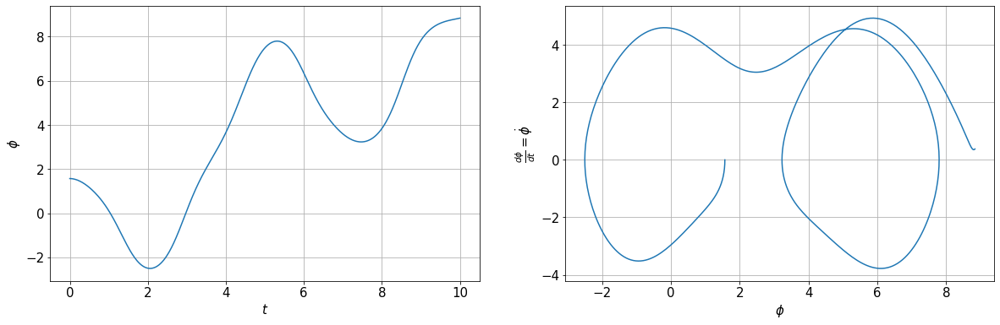

In [14]:
plt.rc('font', size=15)
fig,ax = plt.subplots(1,2,figsize=(20,6))
ax[1].plot(phi,phi_prik)
ax[0].plot(ts,phi)
ax[0].grid(),ax[1].grid()

ax[1].set_xlabel('$\phi$')
ax[1].set_ylabel(r'$\frac{d\phi}{dt}=\dot{\phi}$')

ax[0].set_ylabel('$\phi$')
ax[0].set_xlabel('$t$')


In [15]:
def angle_to_cartesian1(omega_val,omega_val2,A,radius,time_vals):
    x = np.cos(omega_val*time_vals)*radius+A*np.cos(omega_val2*time_vals)
    y = np.sin(omega_val*time_vals)*radius
    return [x,y]

def angle_to_cartesian2(angle_vals,omega_val,radius,length,time_vals):
    x = radius*np.cos(omega_val*time_vals)+length*np.sin(angle_vals)
    y = radius*np.sin(omega_val*time_vals)-length*np.cos(angle_vals)
    return [x,y]

xs1 = angle_to_cartesian1(omega,omega2,A,R,ts)[0].tolist()
ys1 = angle_to_cartesian1(omega,omega2,A,R,ts)[1].tolist()

xs2 = angle_to_cartesian2(phi,omega,R,L,ts)[0].tolist()
ys2 = angle_to_cartesian2(phi,omega,R,L,ts)[1].tolist()

center_xs = []
for i in range(len(ts)):
    center_xs.append(A*np.cos(omega2*ts[i]))

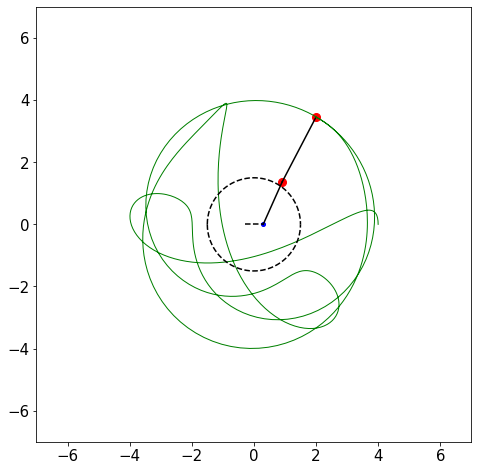

In [16]:
fig, ax = plt.subplots(figsize=(8, 8))

## Center dot Rotation arm and rotation dot ##
dot0, = ax.plot([],[],'ro',ms=4,color = 'blue')
dot1, = ax.plot([],[],'ro',ms=8)
line1, = ax.plot([],[],color='black')

## Pendulum ##
dot2, = ax.plot([],[],'ro',ms=8)
line2, = ax.plot([],[],color='black')

## tracer ##
tracer, = ax.plot([],[],linewidth = 1, color='green')

def update(i):
    dot0.set_data(center_xs[i],0)
    dot1.set_data(xs1[i],ys1[i])
    line1.set_data([center_xs[i],xs1[i]],[0,ys1[i]])
    dot2.set_data(xs2[i],ys2[i])
    line2.set_data([xs1[i],xs2[i]],[ys1[i],ys2[i]])
    tracer.set_data(xs2[0:i+1],ys2[0:i+1])
    
    return line1, dot1, line2, dot2, tracer

def draw_circle(x,radius):
    upper_part = np.sqrt(radius**2-x**2) 
    lower_part = -np.sqrt(radius**2-x**2) 
    return upper_part,lower_part

## Plottinng center and horizontal path ##
ax.plot([-A,A],[0,0],ls='--',color='black')

## Ploting circle path ## 
xs = np.linspace(-R,R,1000)
ax.plot(xs,draw_circle(xs,R)[0],linestyle='--',color='black')
ax.plot(xs,draw_circle(xs,R)[1],linestyle='--',color='black')

## Setting axes #
ax.set_xlim(-7,7), ax.set_ylim(-7,7), ax.set_aspect("equal")

## Animating ##
anim = animation.FuncAnimation(fig,
                               update,
                               frames=len(ts),
                               interval=10,
                               blit=True,
                               repeat_delay=0)
anim